In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams['figure.dpi'] = 500
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder ,OneHotEncoder,StandardScaler
from sklearn.preprocessing import normalize
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

### Company Dataset

In [2]:
df = pd.read_csv(r'C:\Users\shree\Desktop\subject\Data_Science\DS_Assignments\Datasets\Company_Data.csv')
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


In [3]:
df.shape

(400, 11)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


In [5]:
df.describe()

,Sales,CompPrice,Income,Advertising,Population,Price,Age,Education
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,7.496325,124.975000,68.657500,6.635000,264.840000,115.795000,53.322500,13.900000
std,2.824115,15.334512,27.986037,6.650364,147.376436,23.676664,16.200297,2.620528
min,0.000000,77.000000,21.000000,0.000000,10.000000,24.000000,25.000000,10.000000
25%,5.390000,115.000000,42.750000,0.000000,139.000000,100.000000,39.750000,12.000000
50%,7.490000,125.000000,69.000000,5.000000,272.000000,117.000000,54.500000,14.000000
75%,9.320000,135.000000,91.000000,12.000000,398.500000,131.000000,66.000000,16.000000
max,16.270000,175.000000,120.000000,29.000000,509.000000,191.000000,80.000000,18.000000


In [6]:
sns.pairplot(df)

{'whiskers': [<matplotlib.lines.Line2D at 0x231d2bfec80>,
 'caps': [<matplotlib.lines.Line2D at 0x231d2bff1c0>,
 'boxes': [<matplotlib.lines.Line2D at 0x231d2bfe9e0>],
 'medians': [<matplotlib.lines.Line2D at 0x231d2bff700>],
 'fliers': [<matplotlib.lines.Line2D at 0x231d2bff9a0>],
 'means': []}

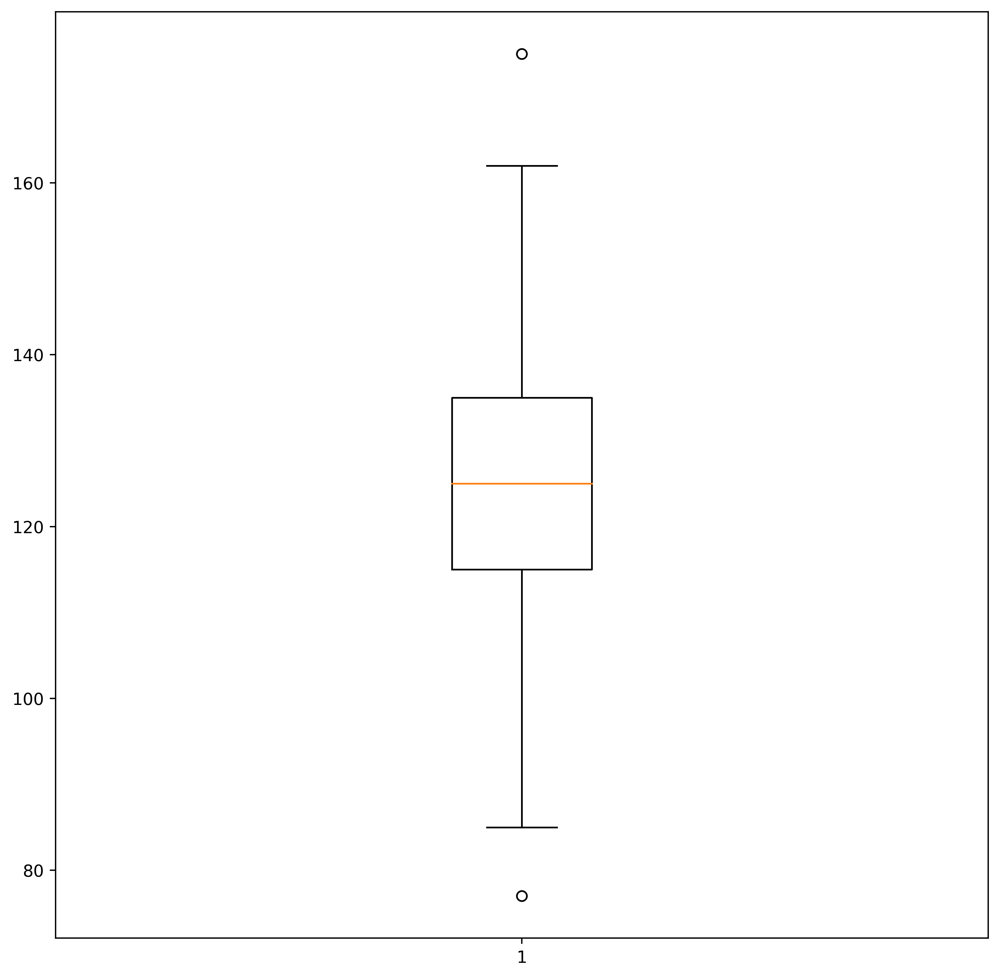

In [7]:
plt.boxplot(df['CompPrice'])

In [8]:
def outlier_cap(df,column):
    for index, row in df.iterrows():
        h = df[column].quantile(0.75)
        l = df[column].quantile(0.25)
        IQR = h - l
        upper_threshold = h + 1.5*IQR
        lower_threshold = l - 1.5*IQR
        if row[column] > upper_threshold:
            df.at[index, column] = upper_threshold
        elif row[column] < lower_threshold:
            df.at[index, column] = lower_threshold

In [9]:
col = ['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price',
     'Age', 'Education']

In [10]:
for i in col:
    outlier_cap(df,i)

In [11]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120.0,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83.0,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80.0,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97.0,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128.0,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128.0,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120.0,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159.0,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95.0,Bad,50,12,Yes,Yes


In [12]:
df['Sales'] = np.where(df['Sales'] >= df['Sales'].mean() , 'yes' , 'no')
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,yes,138,73,11,276,120.0,Bad,42,17,Yes,Yes
1,yes,111,48,16,260,83.0,Good,65,10,Yes,Yes
2,yes,113,35,10,269,80.0,Medium,59,12,Yes,Yes
3,no,117,100,4,466,97.0,Medium,55,14,Yes,Yes
4,no,141,64,3,340,128.0,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,yes,138,108,17,203,128.0,Good,33,14,Yes,Yes
396,no,139,23,3,37,120.0,Medium,55,11,No,Yes
397,no,162,26,12,368,159.0,Medium,40,18,Yes,Yes
398,no,100,79,7,284,95.0,Bad,50,12,Yes,Yes


In [13]:
df['ShelveLoc'].replace({'Bad': 1, "Medium": 2,"Good":3},inplace = True)

In [14]:
le = LabelEncoder()
df['Sales']=le.fit_transform(df['Sales'])

In [15]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,1,138,73,11,276,120.0,1,42,17,Yes,Yes
1,1,111,48,16,260,83.0,3,65,10,Yes,Yes
2,1,113,35,10,269,80.0,2,59,12,Yes,Yes
3,0,117,100,4,466,97.0,2,55,14,Yes,Yes
4,0,141,64,3,340,128.0,1,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,1,138,108,17,203,128.0,3,33,14,Yes,Yes
396,0,139,23,3,37,120.0,2,55,11,No,Yes
397,0,162,26,12,368,159.0,2,40,18,Yes,Yes
398,0,100,79,7,284,95.0,1,50,12,Yes,Yes


In [16]:
df_encoded = pd.get_dummies(df,drop_first = True)

In [17]:
df_encoded

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,1,138,73,11,276,120.0,1,42,17,1,1
1,1,111,48,16,260,83.0,3,65,10,1,1
2,1,113,35,10,269,80.0,2,59,12,1,1
3,0,117,100,4,466,97.0,2,55,14,1,1
4,0,141,64,3,340,128.0,1,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,1,138,108,17,203,128.0,3,33,14,1,1
396,0,139,23,3,37,120.0,2,55,11,0,1
397,0,162,26,12,368,159.0,2,40,18,1,1
398,0,100,79,7,284,95.0,1,50,12,1,1


In [18]:
x = df_encoded.drop(columns = ['Sales'])
x

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,138,73,11,276,120.0,1,42,17,1,1
1,111,48,16,260,83.0,3,65,10,1,1
2,113,35,10,269,80.0,2,59,12,1,1
3,117,100,4,466,97.0,2,55,14,1,1
4,141,64,3,340,128.0,1,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128.0,3,33,14,1,1
396,139,23,3,37,120.0,2,55,11,0,1
397,162,26,12,368,159.0,2,40,18,1,1
398,100,79,7,284,95.0,1,50,12,1,1


In [19]:
y = df_encoded['Sales']
y

0      1
1      1
2      1
3      0
4      0
      ..
395    1
396    0
397    0
398    0
399    1
Name: Sales, Length: 400, dtype: int32

In [20]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2, random_state=42)

In [21]:
dtr = DecisionTreeClassifier(criterion='gini' , max_depth=3)

dtr.fit(xtrain,ytrain)
yp = dtr.predict(xtest)
yp

array([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1])

In [22]:
dtr.score(xtrain,ytrain), dtr.score(xtest,ytest)

(0.746875, 0.6125)

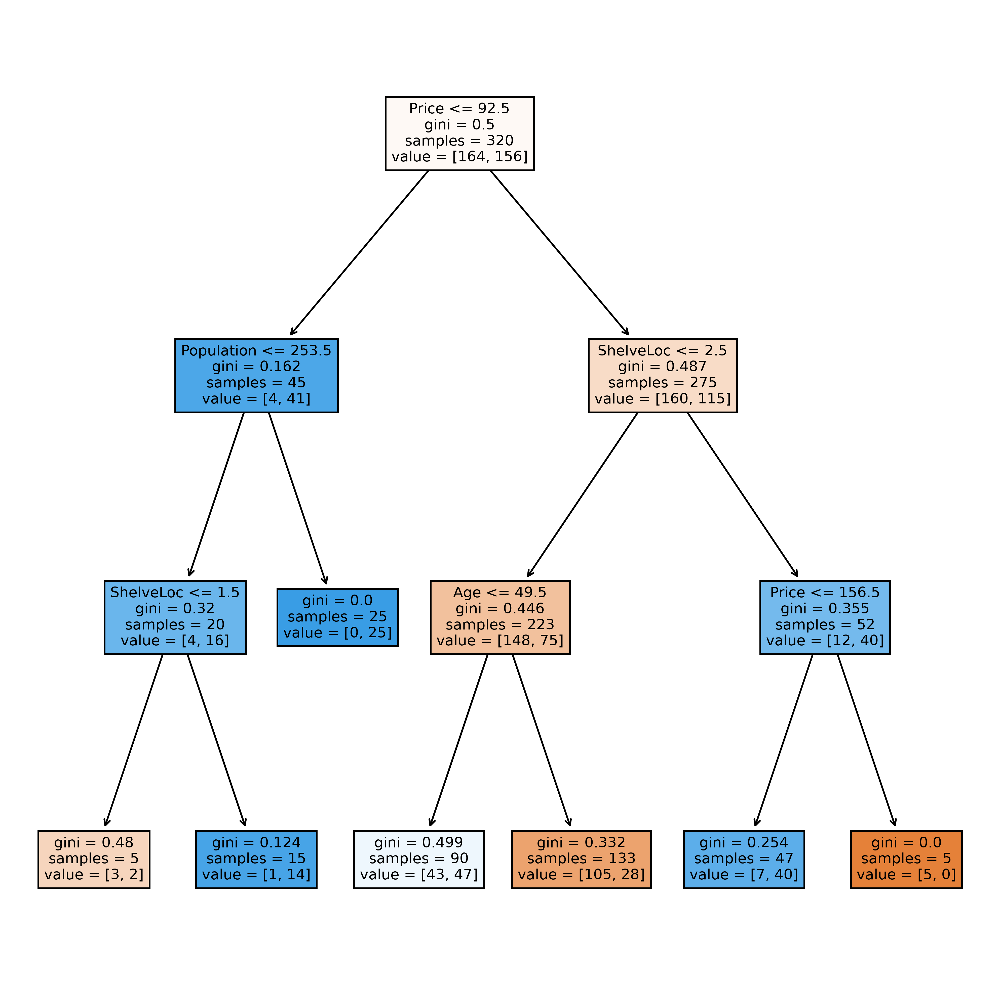

In [23]:
tree.plot_tree(dtr, feature_names=['CompPrice', 'Income', 'Advertising','Population','Price','ShelveLoc','Age','Education',],max_depth=3, filled=True)
plt.show()

In [24]:
params = {
    'criterion' : ["gini", "entropy", "log_loss"],
    'max_depth' : [2,3,4,5,6,7,8],
    'splitter' :['best','random'],
    'max_features': [1,2,3,4,5],
 'min_samples_split': [0.25,0.5,1,1.25,1.5,2]
}

In [25]:
grid = GridSearchCV(estimator=DecisionTreeClassifier(), param_grid=params,cv = 5,
                   verbose=2,n_jobs = -1)

In [26]:
grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 1260 candidates, totalling 6300 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 3, 4, 5, 6, 7, 8],
                         'max_features': [1, 2, 3, 4, 5],
                         'min_samples_split': [0.25, 0.5, 1, 1.25, 1.5, 2],
                         'splitter': ['best', 'random']},
             verbose=2)

In [27]:
grid.best_params_

{'criterion': 'log_loss',
 'max_depth': 4,
 'max_features': 5,
 'min_samples_split': 2,
 'splitter': 'best'}

In [28]:
criteria = grid.best_params_['criterion']
max_depth = grid.best_params_['max_depth']
max_features = grid.best_params_['max_features']
min_samples_split = grid.best_params_['min_samples_split']
splitter = grid.best_params_['splitter']


In [29]:
print(criteria,max_depth,max_features,min_samples_split,splitter)

log_loss 4 5 2 best


In [30]:
dtr = DecisionTreeClassifier(criterion=criteria,max_depth=max_depth,splitter=splitter, 
                             max_features= max_features,min_samples_split= min_samples_split)

In [31]:
dtr.fit(xtrain,ytrain)
ypred  = dtr.predict(xtest)

In [32]:
dtr.score(xtrain,ytrain),dtr.score(xtest,ytest)

(0.825, 0.75)

In [33]:
print(classification_report(ypred , ytest))

              precision    recall  f1-score   support

           0       0.68      0.76      0.71        33
           1       0.81      0.74      0.78        47

    accuracy                           0.75        80
   macro avg       0.74      0.75      0.75        80
weighted avg       0.76      0.75      0.75        80



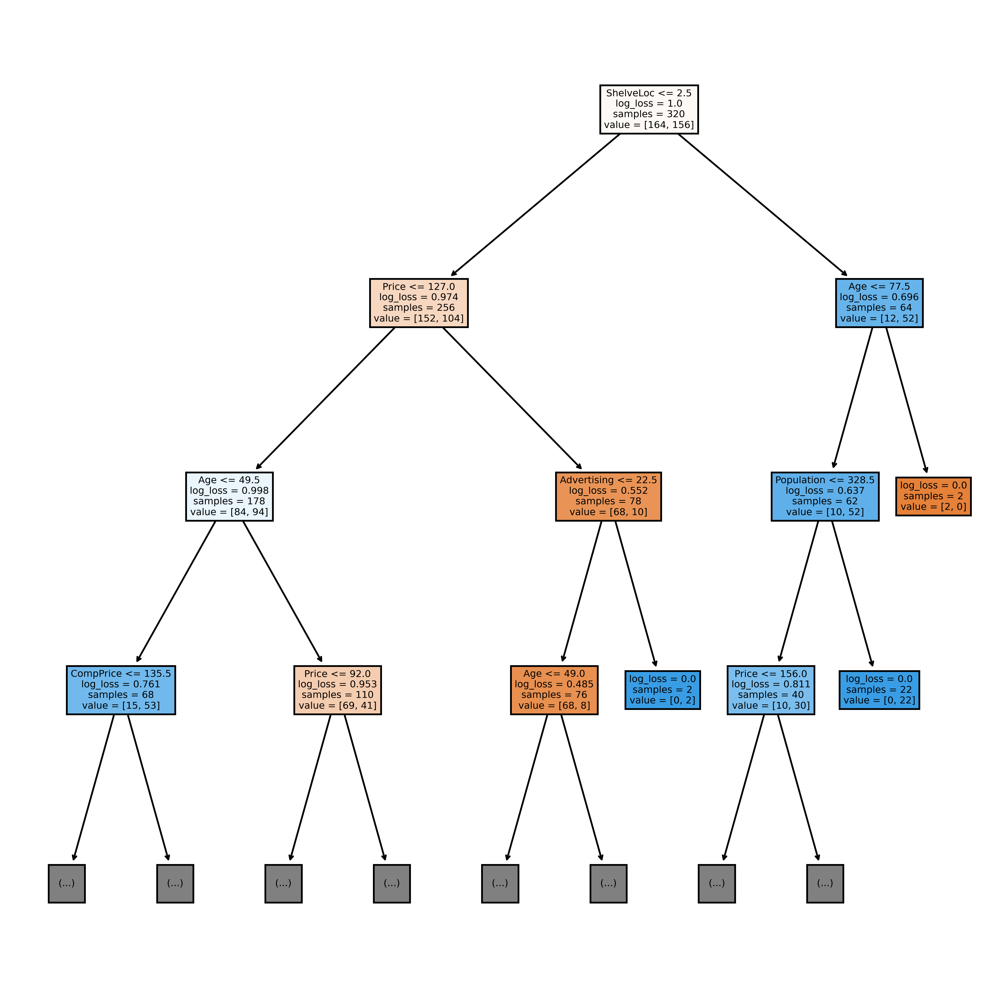

In [34]:
tree.plot_tree(dtr, feature_names=['CompPrice', 'Income', 'Advertising','Population','Price','ShelveLoc','Age','Education',],max_depth=3, filled=True)
plt.show()

## Fraud_Check Dataset

In [35]:
fraud = pd.read_csv(r'C:\Users\shree\Desktop\subject\Data_Science\DS_Assignments\Datasets\Fraud_check.csv')
fraud

,Undergrad,Marital.Status,Taxable.Income,City.Population,Work.Experience,Urban
0,NO,Single,68833,50047,10,YES
1,YES,Divorced,33700,134075,18,YES
2,NO,Married,36925,160205,30,YES
3,YES,Single,50190,193264,15,YES
4,NO,Married,81002,27533,28,NO
...,...,...,...,...,...,...
595,YES,Divorced,76340,39492,7,YES
596,YES,Divorced,69967,55369,2,YES
597,NO,Divorced,47334,154058,0,YES
598,YES,Married,98592,180083,17,NO


In [36]:
fraud.shape

(600, 6)

In [37]:
fraud.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600 entries, 0 to 599
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Undergrad        600 non-null    object
 1   Marital.Status   600 non-null    object
 2   Taxable.Income   600 non-null    int64 
 3   City.Population  600 non-null    int64 
 4   Work.Experience  600 non-null    int64 
 5   Urban            600 non-null    object
dtypes: int64(3), object(3)
memory usage: 28.2+ KB


In [38]:
fraud.duplicated().sum()

0

In [39]:
fraud.describe()

,Taxable.Income,City.Population,Work.Experience
count,600.000000,600.000000,600.000000
mean,55208.375000,108747.368333,15.558333
std,26204.827597,49850.075134,8.842147
min,10003.000000,25779.000000,0.000000
25%,32871.500000,66966.750000,8.000000
50%,55074.500000,106493.500000,15.000000
75%,78611.750000,150114.250000,24.000000
max,99619.000000,199778.000000,30.000000


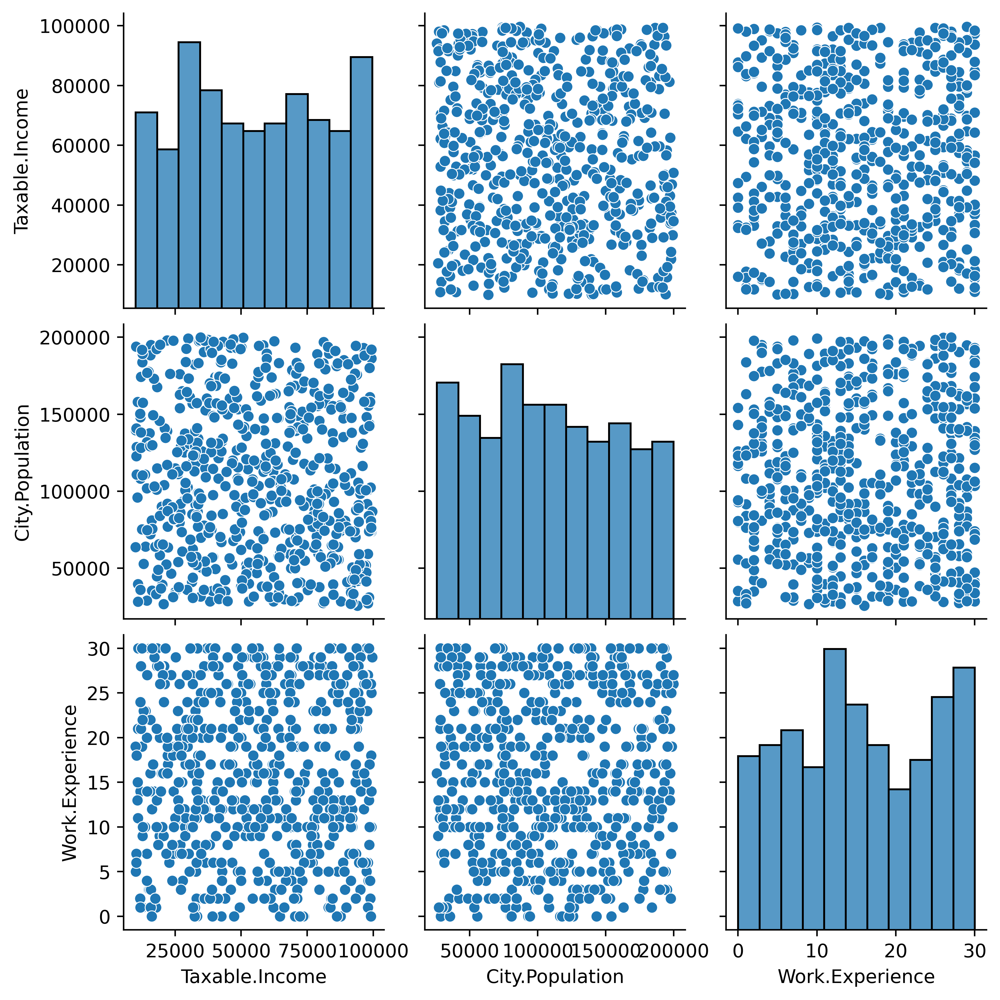

In [40]:
sns.pairplot(fraud)

In [41]:
fraud['Defaulter'] = np.where(fraud['Taxable.Income'] <= 30000 , 'Risky' , 'good')
fraud

,Undergrad,Marital.Status,Taxable.Income,City.Population,Work.Experience,Urban,Defaulter
0,NO,Single,68833,50047,10,YES,good
1,YES,Divorced,33700,134075,18,YES,good
2,NO,Married,36925,160205,30,YES,good
3,YES,Single,50190,193264,15,YES,good
4,NO,Married,81002,27533,28,NO,good
...,...,...,...,...,...,...,...
595,YES,Divorced,76340,39492,7,YES,good
596,YES,Divorced,69967,55369,2,YES,good
597,NO,Divorced,47334,154058,0,YES,good
598,YES,Married,98592,180083,17,NO,good


In [42]:
fraud[fraud['Defaulter'] == 'Risky']

,Undergrad,Marital.Status,Taxable.Income,City.Population,Work.Experience,Urban,Defaulter
10,NO,Single,29732,102602,19,YES,Risky
12,NO,Divorced,11794,148033,14,YES,Risky
16,YES,Divorced,24987,34551,29,NO,Risky
19,NO,Single,10987,126953,30,YES,Risky
21,YES,Divorced,14310,29106,7,YES,Risky
...,...,...,...,...,...,...,...
544,NO,Single,29916,133877,21,YES,Risky
557,YES,Married,12810,157421,10,NO,Risky
567,YES,Single,16316,129912,30,NO,Risky
575,NO,Divorced,10735,95975,13,YES,Risky


In [43]:
fraud['Defaulter'].replace({'good': 0, "Risky": 1},inplace = True)

In [44]:
fraud_encoded = pd.get_dummies(fraud,drop_first = True)

In [45]:
fraud_encoded

,Taxable.Income,City.Population,Work.Experience,Defaulter,Undergrad_YES,Marital.Status_Married,Marital.Status_Single,Urban_YES
0,68833,50047,10,0,0,0,1,1
1,33700,134075,18,0,1,0,0,1
2,36925,160205,30,0,0,1,0,1
3,50190,193264,15,0,1,0,1,1
4,81002,27533,28,0,0,1,0,0
...,...,...,...,...,...,...,...,...
595,76340,39492,7,0,1,0,0,1
596,69967,55369,2,0,1,0,0,1
597,47334,154058,0,0,0,0,0,1
598,98592,180083,17,0,1,1,0,0


In [46]:
x1 = fraud_encoded.drop(columns = ['Defaulter'])
x1

,Taxable.Income,City.Population,Work.Experience,Undergrad_YES,Marital.Status_Married,Marital.Status_Single,Urban_YES
0,68833,50047,10,0,0,1,1
1,33700,134075,18,1,0,0,1
2,36925,160205,30,0,1,0,1
3,50190,193264,15,1,0,1,1
4,81002,27533,28,0,1,0,0
...,...,...,...,...,...,...,...
595,76340,39492,7,1,0,0,1
596,69967,55369,2,1,0,0,1
597,47334,154058,0,0,0,0,1
598,98592,180083,17,1,1,0,0


In [47]:
y1 = fraud_encoded['Defaulter']
y1

0      0
1      0
2      0
3      0
4      0
      ..
595    0
596    0
597    0
598    0
599    0
Name: Defaulter, Length: 600, dtype: int64

In [48]:
xtrain_f,xtest_f,ytrain_f,ytest_f = train_test_split(x1,y1,test_size=0.2, random_state=42)

In [49]:
dtr = DecisionTreeClassifier(criterion='gini' , max_depth=3)

dtr.fit(xtrain_f,ytrain_f)
yp1 = dtr.predict(xtest_f)
yp1

array([1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1], dtype=int64)

In [50]:
dtr.score(xtrain_f,ytrain_f), dtr.score(xtest_f,ytest_f)

(1.0, 1.0)

In [51]:
fraud.columns

Index(['Undergrad', 'Marital.Status', 'Taxable.Income', 'City.Population',
       'Work.Experience', 'Urban', 'Defaulter'],
      dtype='object')

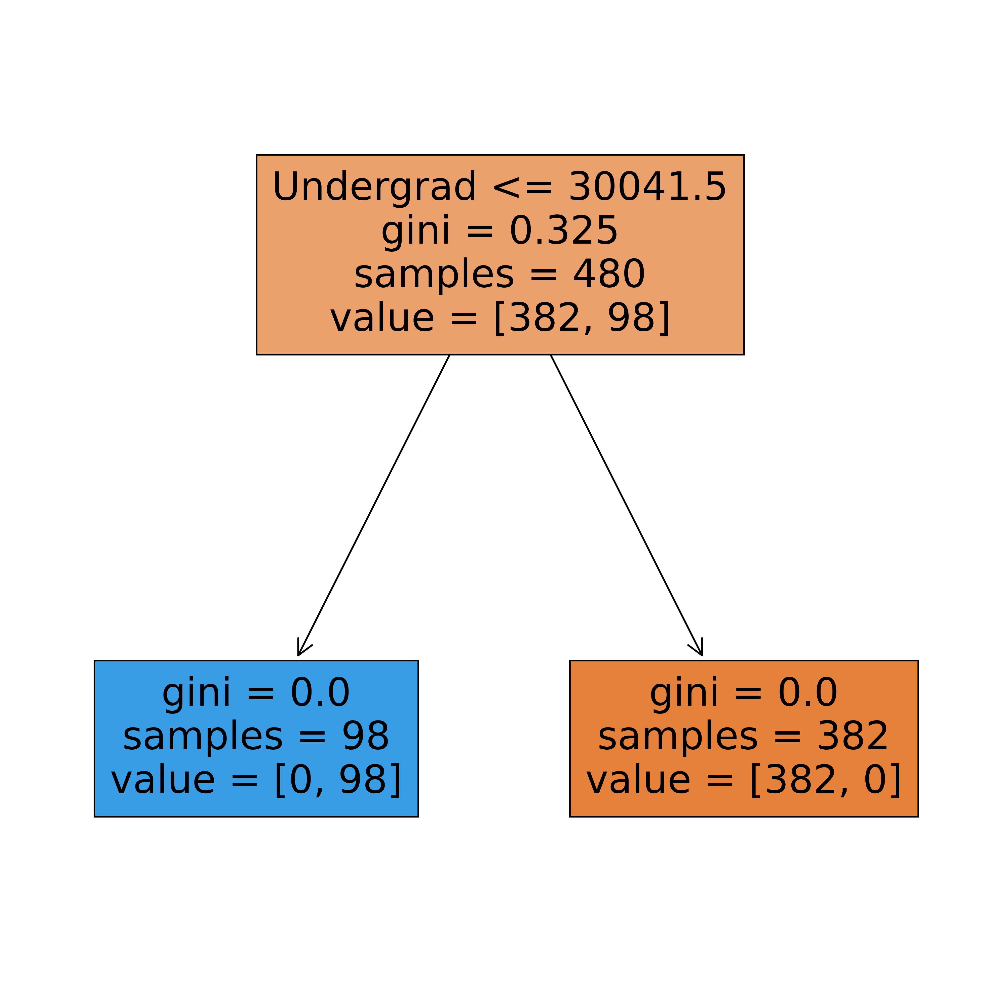

In [52]:
tree.plot_tree(dtr, feature_names=['Undergrad', 'Marital.Status', 'Taxable.Income', 'City.Population',
       'Work.Experience', 'Urban', 'Defaulter'],max_depth=3, filled=True)
plt.show()

In [53]:
params = {
    'criterion' : ["gini", "entropy", "log_loss"],
    'max_depth' : [2,3,4,5,6,7,8],
    'splitter' :['best','random'],
    'max_features': [1,2,3,4,5],
 'min_samples_split': [0.25,0.5,1,1.25,1.5,2]
}

In [54]:
grid = GridSearchCV(estimator=DecisionTreeClassifier(), param_grid=params,cv = 5,
                   verbose=2,n_jobs = -1)

In [55]:
grid.fit(xtrain_f,ytrain_f)

Fitting 5 folds for each of 1260 candidates, totalling 6300 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 3, 4, 5, 6, 7, 8],
                         'max_features': [1, 2, 3, 4, 5],
                         'min_samples_split': [0.25, 0.5, 1, 1.25, 1.5, 2],
                         'splitter': ['best', 'random']},
             verbose=2)

In [56]:
criteria_f = grid.best_params_['criterion']
max_depth_f = grid.best_params_['max_depth']
max_features_f = grid.best_params_['max_features']
min_samples_split_f = grid.best_params_['min_samples_split']
splitter_f = grid.best_params_['splitter']


In [57]:
print(criteria_f,max_depth_f,max_features_f,min_samples_split_f,splitter_f)

gini 2 5 0.5 best


In [58]:
dtr = DecisionTreeClassifier(criterion=criteria_f,max_depth=max_depth_f,splitter=splitter_f, 
                             max_features= max_features_f,min_samples_split= min_samples_split_f)

In [59]:
dtr.fit(xtrain,ytrain)
ypred  = dtr.predict(xtest)

In [60]:
dtr.score(xtrain,ytrain),dtr.score(xtest,ytest)

(0.715625, 0.7625)

In [61]:
print(classification_report(ypred , ytest))

              precision    recall  f1-score   support

           0       0.86      0.70      0.77        46
           1       0.67      0.85      0.75        34

    accuracy                           0.76        80
   macro avg       0.77      0.77      0.76        80
weighted avg       0.78      0.76      0.76        80



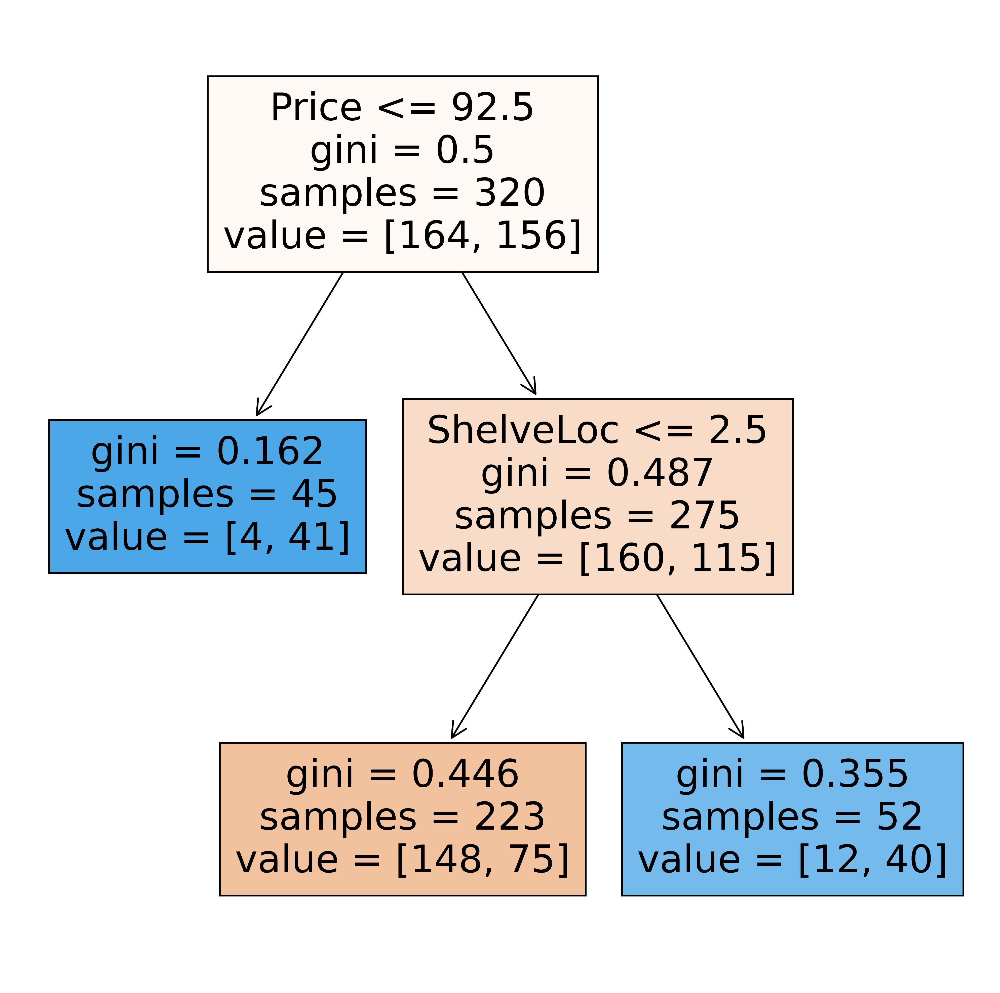

In [62]:
tree.plot_tree(dtr, feature_names=['CompPrice', 'Income', 'Advertising','Population','Price','ShelveLoc','Age','Education',],max_depth=3, filled=True)
plt.show()